In [1]:
#standard includes

import matplotlib
import numpy as np
from ipywidgets import interact
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from mpl_toolkits.axes_grid1 import make_axes_locatable

%matplotlib inline
import mpld3
mpld3.enable_notebook()

rng = np.random

import math

import numba

matplotlib.rcParams['figure.figsize'] = (12.0, 6)

import SmoothedMinimization as SmoothedMinimization

In [2]:

def get_avg(LQ3):
    t1 = np.zeros([Iterations,len(LQ3)])
    i=0
    for LQ in LQ3:
        t1[:,i] = LQ.totalCost
        i+=1
    return np.mean(t1,axis=1)

def get_med(LQ3):
    t1 = np.zeros([Iterations,len(LQ3)])
    i=0
    for LQ in LQ3:
        t1[:,i] = LQ.totalCost
        i+=1
    return np.median(t1,axis=1)

def get_cost(LQ3):
    t1 = []
    for LQ in LQ3:
        t1.append(LQ.totalCost)
    return np.asarray(t1)

In [3]:
def dynamics(self,x,uplusnoise):
    xnew = x.copy()
    
    omega = x[:,0]
    phi = x[:,1]
    
    xnew[:,0] = x[:,0] + self.dt*(-0.1*omega -10*np.sin(phi) + 0.2*uplusnoise)
    xnew[:,1] = x[:,1] + self.dt*(omega)
    
    return xnew


def V(self,x,i):
    y=-np.cos(x[:,1])
    V = 0
    if i==(self.ln-1):
        V = -500*y+10*x[:,0]**2
        V = V/self.dt
    return V

def basisfunctions(self,x):
    arrays = [x[:,0],np.sin(x[:,1]),np.cos(x[:,1]),np.ones(x[:,0].shape)]
    return np.stack(arrays)

SmoothedMinimization.SmoothedMinimization.dynamics = dynamics
SmoothedMinimization.SmoothedMinimization.V = V
SmoothedMinimization.SmoothedMinimization.basisfunctions = basisfunctions

In [ ]:
Iterations =1500
T = 3. #Horizont
dt = 0.01
N = 500 #number of rollouts
M=4 #number of basis functions
D=2
xinit = np.array([0,0])

cgit=-1

delta = 2.0
epsilon = 0.01

In [ ]:
LQ1 = []

for i in range(10):
    LQ1.append(SmoothedMinimization.SmoothedMinimization(Iterations, T, dt, N, M,D,xinit, delta,epsilon))
    print(i)

i = 1
for LQ in LQ1:
    LQ.run("TRPO",0,0,maxit=cgit)
    LQ.plot()
    print(i)
    i = i + 1

0
1
2
3
4
5
6
7
8
9
TRPO


In [ ]:
LQ2 = []

for i in range(10):
    LQ2.append(SmoothedMinimization.SmoothedMinimization(Iterations, T, dt, N, M,D,xinit, 0.1,epsilon))
    print(i)

i = 1
for LQ in LQ2:
    LQ.run("naturalPICE",0,0,maxit=cgit)
    LQ.plot()
    print(i)
    i = i + 1

In [ ]:
LQ3 = []

for i in range(10):
    LQ3.append(SmoothedMinimization.SmoothedMinimization(Iterations, T, dt, N, M,D,xinit, 0.5,epsilon))
    print(i)

i = 1
for LQ in LQ3:
    LQ.run("naturalPICE",0,0,maxit=cgit)
    LQ.plot()
    print(i)
    i = i + 1

In [ ]:
LQ4 = []

for i in range(10):
    LQ4.append(SmoothedMinimization.SmoothedMinimization(Iterations, T, dt, N, M,D,xinit, 1.,epsilon))
    print(i)

i = 1
for LQ in LQ4:
    LQ.run("naturalPICE",0,0,maxit=cgit)
    LQ.plot()
    print(i)
    i = i + 1

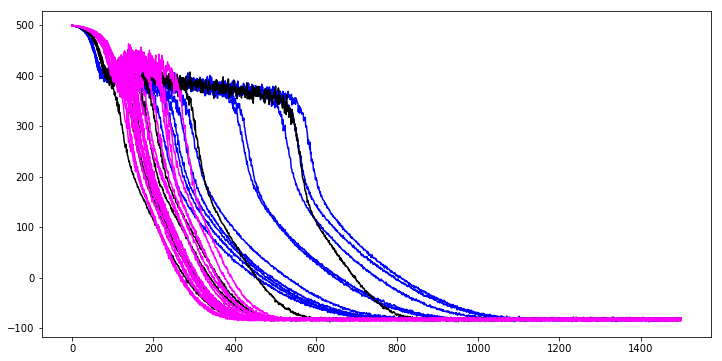

In [16]:
for LQ in LQ1:
    plt.plot(LQ.totalCost,'blue');
    
for LQ in LQ2:
    plt.plot(LQ.totalCost,'black');
    
for LQ in LQ3:
    plt.plot(LQ.totalCost,'magenta');

for LQ in LQ4:
    plt.plot(LQ.totalCost,'magenta');

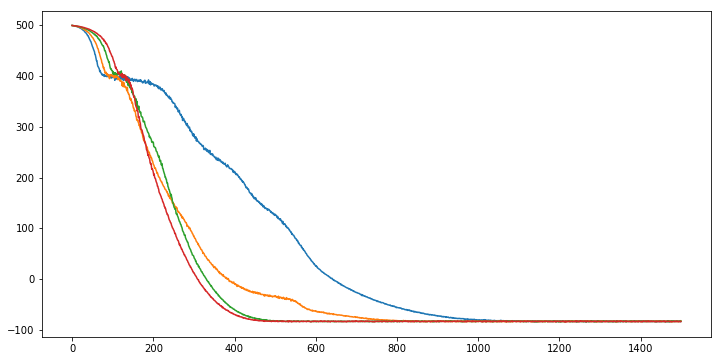

In [14]:
plt.plot(get_avg(LQ1))
plt.plot(get_avg(LQ2))
plt.plot(get_avg(LQ3))
plt.plot(get_avg(LQ4))

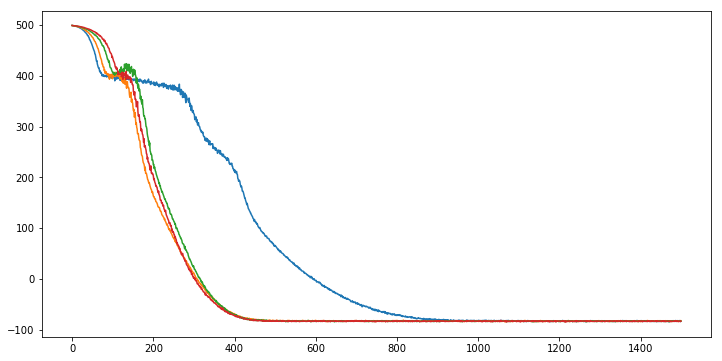

In [15]:
plt.plot(get_med(LQ1))
plt.plot(get_med(LQ2))
plt.plot(get_med(LQ3))
plt.plot(get_med(LQ4))

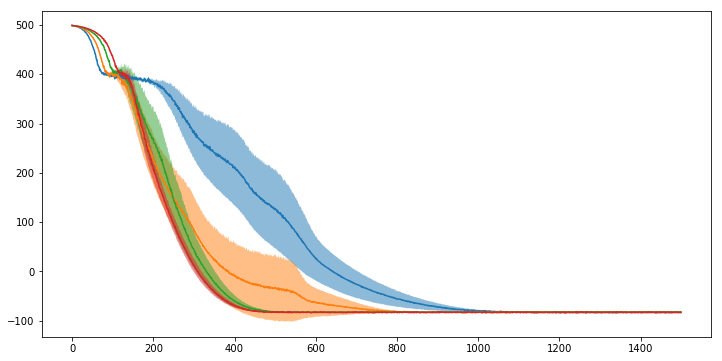

In [17]:
stamp = "Chapter4PendulumEndCost2018"
file_path = "newChapter4Data/"

file_identifier = stamp+"Noise0.2N500smallTRPOpinv"
Jdata=get_cost(LQ1)
np.save(file_path+file_identifier+".npy",Jdata)


plt.plot(Jdata.mean(axis=0))
plt.fill_between(np.arange(0,1500), Jdata.mean(axis=0)+Jdata.std(axis=0)*0.5, Jdata.mean(axis=0)-Jdata.std(axis=0)*0.5, alpha=0.5,edgecolor='none')



file_identifier = stamp+"Noise0.2N500smallJ0.1pinv"
Jdata=get_cost(LQ2)
np.save(file_path+file_identifier+".npy",Jdata)

plt.plot(Jdata.mean(axis=0))
plt.fill_between(np.arange(0,1500), Jdata.mean(axis=0)+Jdata.std(axis=0)*0.5, Jdata.mean(axis=0)-Jdata.std(axis=0)*0.5, alpha=0.5,edgecolor='none')


file_identifier = stamp+"Noise0.2N500smallJ0.5pinv"
Jdata=get_cost(LQ3)
np.save(file_path+file_identifier+".npy",Jdata)

plt.plot(Jdata.mean(axis=0))
plt.fill_between(np.arange(0,1500), Jdata.mean(axis=0)+Jdata.std(axis=0)*0.5, Jdata.mean(axis=0)-Jdata.std(axis=0)*0.5, alpha=0.5,edgecolor='none')


file_identifier = stamp+"Noise0.2N500smallJ1.0pinv"
Jdata=get_cost(LQ4)
np.save(file_path+file_identifier+".npy",Jdata)

plt.plot(Jdata.mean(axis=0))
plt.fill_between(np.arange(0,1500), Jdata.mean(axis=0)+Jdata.std(axis=0)*0.5, Jdata.mean(axis=0)-Jdata.std(axis=0)*0.5, alpha=0.5,edgecolor='none')


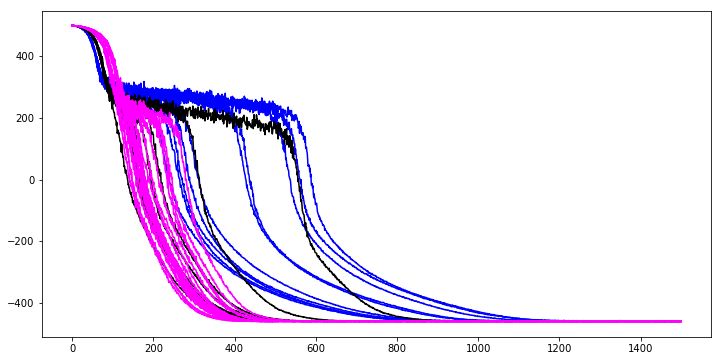

In [18]:
for LQ in LQ1:
        plt.plot(np.mean(LQ.VCosts,axis=1),'blue')
    
for LQ in LQ2:
        plt.plot(np.mean(LQ.VCosts,axis=1),'black')
    
for LQ in LQ3:
        plt.plot(np.mean(LQ.VCosts,axis=1),'magenta');

for LQ in LQ4:
        plt.plot(np.mean(LQ.VCosts,axis=1),'magenta');


